In [1]:
import numpy as np
import pandas as pd
import weightedstats as ws
import math
import seaborn as sns
import matplotlib.pyplot as plt
import datetime
import warnings
import math
warnings.filterwarnings("ignore")
pd.pandas.set_option("display.max_columns" , None)
%matplotlib inline

In [2]:
df = pd.read_csv("weatherAUS.csv", parse_dates = ["Date"])
df["Month"] = pd.to_datetime(df["Date"]).dt.month
df["Year"] = pd.to_datetime(df["Date"]).dt.year
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RISK_MM,RainTomorrow,Month,Year
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,0.0,No,12,2008
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,0.0,No,12,2008
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,0.0,No,12,2008
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,1.0,No,12,2008
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,0.2,No,12,2008


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142193 entries, 0 to 142192
Data columns (total 26 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   Date           142193 non-null  datetime64[ns]
 1   Location       142193 non-null  object        
 2   MinTemp        141556 non-null  float64       
 3   MaxTemp        141871 non-null  float64       
 4   Rainfall       140787 non-null  float64       
 5   Evaporation    81350 non-null   float64       
 6   Sunshine       74377 non-null   float64       
 7   WindGustDir    132863 non-null  object        
 8   WindGustSpeed  132923 non-null  float64       
 9   WindDir9am     132180 non-null  object        
 10  WindDir3pm     138415 non-null  object        
 11  WindSpeed9am   140845 non-null  float64       
 12  WindSpeed3pm   139563 non-null  float64       
 13  Humidity9am    140419 non-null  float64       
 14  Humidity3pm    138583 non-null  float64       
 15  

In [4]:
round((df.isnull().sum()/df.shape[0])*100,2)

Date              0.00
Location          0.00
MinTemp           0.45
MaxTemp           0.23
Rainfall          0.99
Evaporation      42.79
Sunshine         47.69
WindGustDir       6.56
WindGustSpeed     6.52
WindDir9am        7.04
WindDir3pm        2.66
WindSpeed9am      0.95
WindSpeed3pm      1.85
Humidity9am       1.25
Humidity3pm       2.54
Pressure9am       9.86
Pressure3pm       9.83
Cloud9am         37.74
Cloud3pm         40.15
Temp9am           0.64
Temp3pm           1.92
RainToday         0.99
RISK_MM           0.00
RainTomorrow      0.00
Month             0.00
Year              0.00
dtype: float64

## Imputations

We will use two methods to perform the imputations and compare them to select to the best suitable method.

### 1) Mean Imputation w.r.t corresponding Location & Month

For this imputation method we will first select those continous features which have data for all the locations available. In our dataset we have 9 such features namely :
* MinTemp
* MaxTemp
* Rainfall
* WindSpeed9am
* WindSpeed3pm
* Humidity9am
* Humidity3pm
* Temp9am
* Temp3pm

In [5]:
continuous_features = ['MinTemp','MaxTemp','Rainfall','WindSpeed9am','WindSpeed3pm',
                       'Humidity9am','Humidity3pm','Temp9am','Temp3pm']
continuous_features

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Temp9am',
 'Temp3pm']

For the remaining features and all the categorical features we will use Mice Forest Imputation.

In [6]:
# Creating a list of categorical features
categorical_variables = [x for x in df.select_dtypes(include = "object")]
categorical_variables.remove("Location")

In [7]:
df["Cloud9am"] = np.where(df["Cloud9am"] == 9.0 , 8.0 , df["Cloud9am"])
df["Cloud3pm"] = np.where(df["Cloud3pm"] == 9.0 , 8.0 , df["Cloud3pm"])

In [8]:
df3 = df.copy() 

__Below is the code for imputation in the continuous features.__

In [9]:
for columns in continuous_features:
    x = df3[df3[columns].isnull()]
    for indexes in list(x.index):      
        b=df3.iloc[indexes]['Month']
        c=df3.iloc[indexes]['Location']
        y=df3[df3['Location']==c]
        z=y[y['Month']==b]
        mn=z[columns].mean()
        df3.at[indexes,columns]=mn

In [10]:
round((df3[continuous_features].isnull().sum() / df3.shape[0])*100,2)

MinTemp         0.0
MaxTemp         0.0
Rainfall        0.0
WindSpeed9am    0.0
WindSpeed3pm    0.0
Humidity9am     0.0
Humidity3pm     0.0
Temp9am         0.0
Temp3pm         0.0
dtype: float64

__Mice Forest Imputation.__

In [11]:
## Using Miceforest
import miceforest as mf
kernel = mf.MultipleImputedKernel(data = df3 , save_all_iterations= True , random_state=0)
new_imputed_data = kernel.impute_new_data(df3)
Method1 = new_imputed_data.complete_data(0)

In [12]:
Method1.isnull().sum()             # Checking out the Method1 null values.

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RISK_MM          0
RainTomorrow     0
Month            0
Year             0
dtype: int64

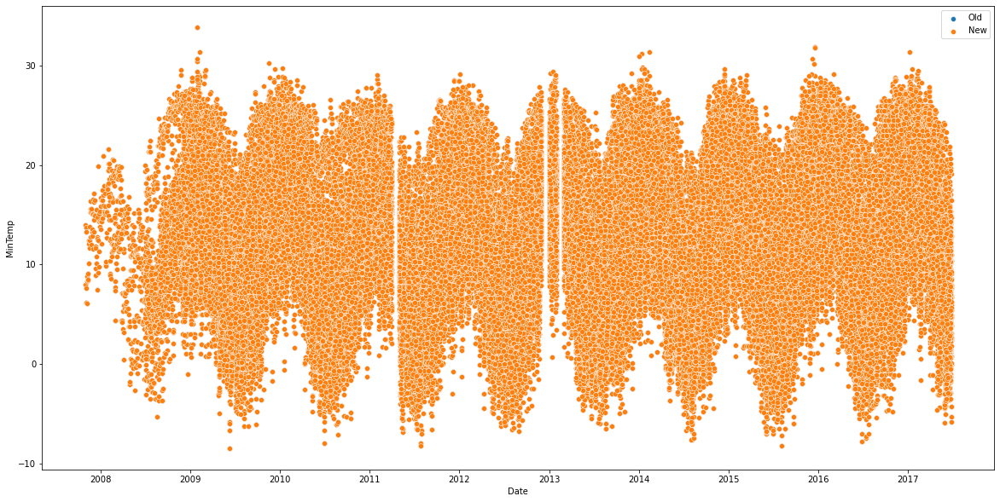

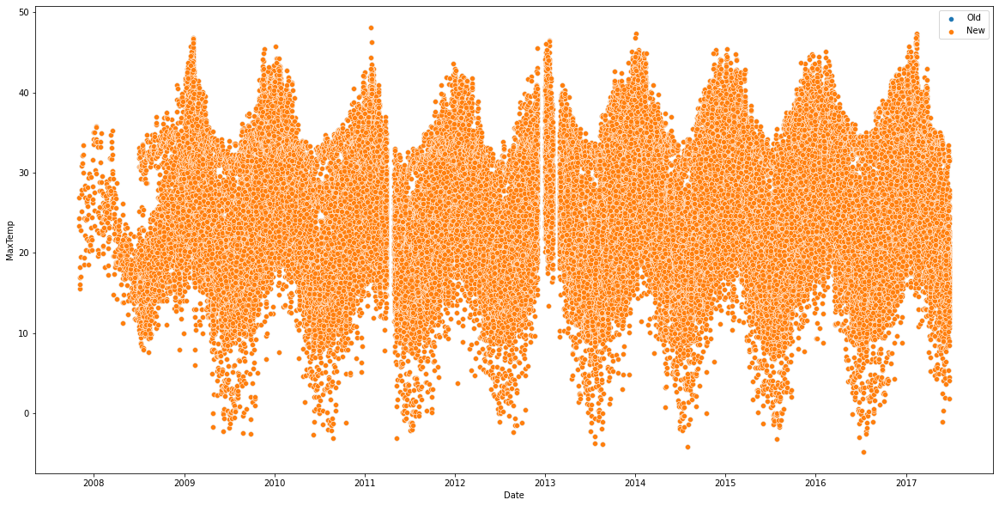

In [13]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["MinTemp"],label="Old")
sns.scatterplot(x=Method1["Date"],y=Method1["MinTemp"],label="New")
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["MaxTemp"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["MaxTemp"],label='New')
plt.show()

<AxesSubplot:xlabel='Date', ylabel='Rainfall'>

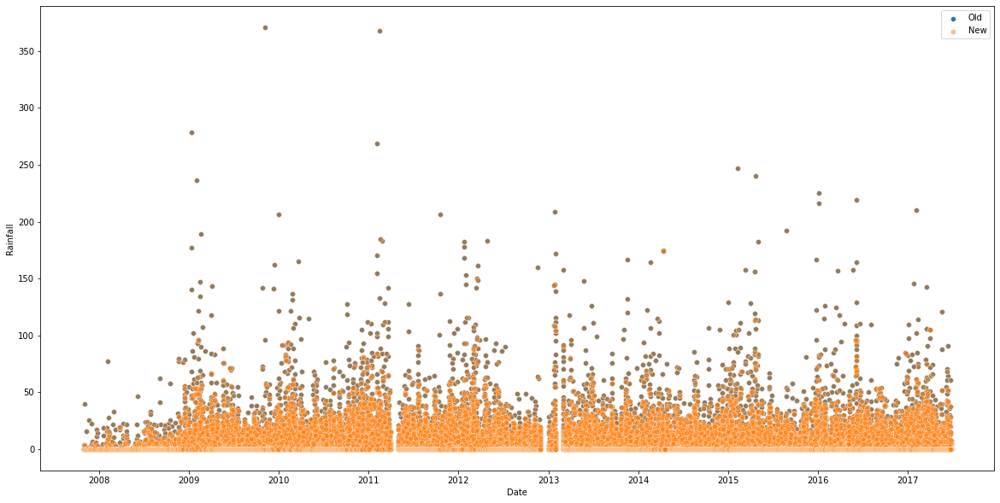

In [14]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Rainfall"],label='Old' )
sns.scatterplot(x=Method1["Date"],y=Method1["Rainfall"],label='New' , alpha = 0.5)

<AxesSubplot:xlabel='Date', ylabel='Evaporation'>

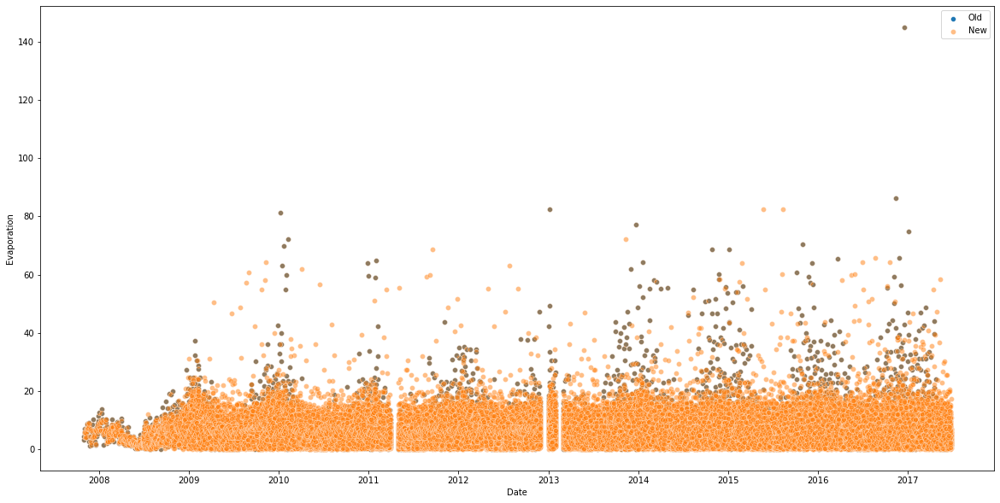

In [15]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Evaporation"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Evaporation"],label='New',alpha = 0.5)

<AxesSubplot:xlabel='Date', ylabel='Sunshine'>

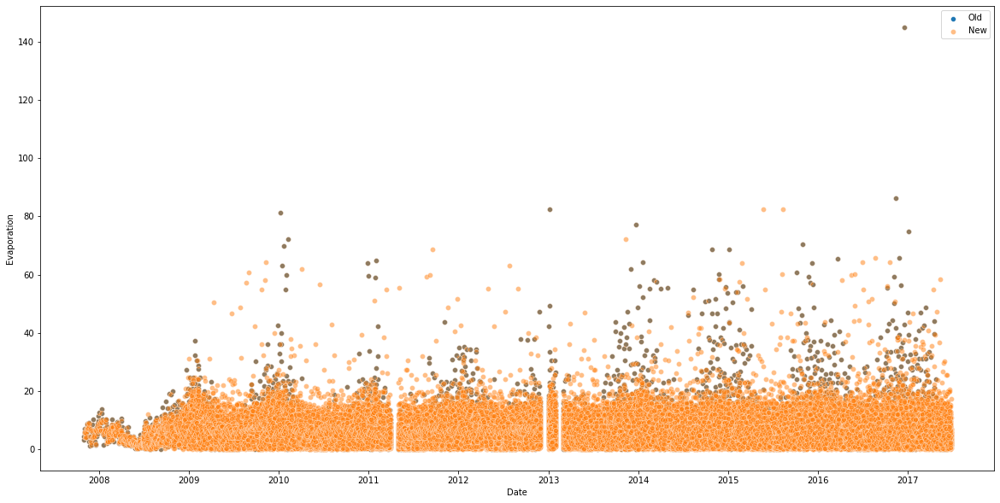

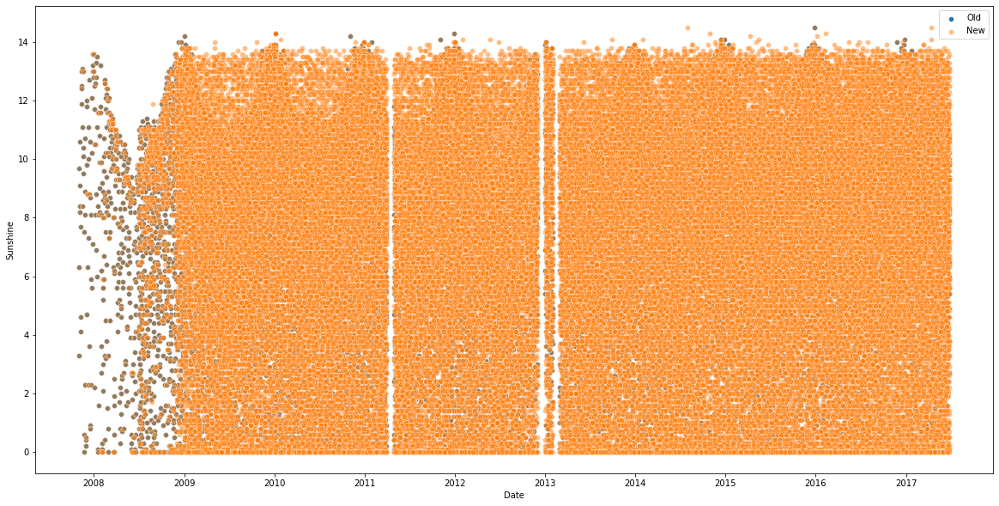

In [16]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Evaporation"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Evaporation"],label='New' , alpha = 0.5)

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Sunshine"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Sunshine"],label='New' , alpha = 0.5)

<AxesSubplot:xlabel='Date', ylabel='WindGustSpeed'>

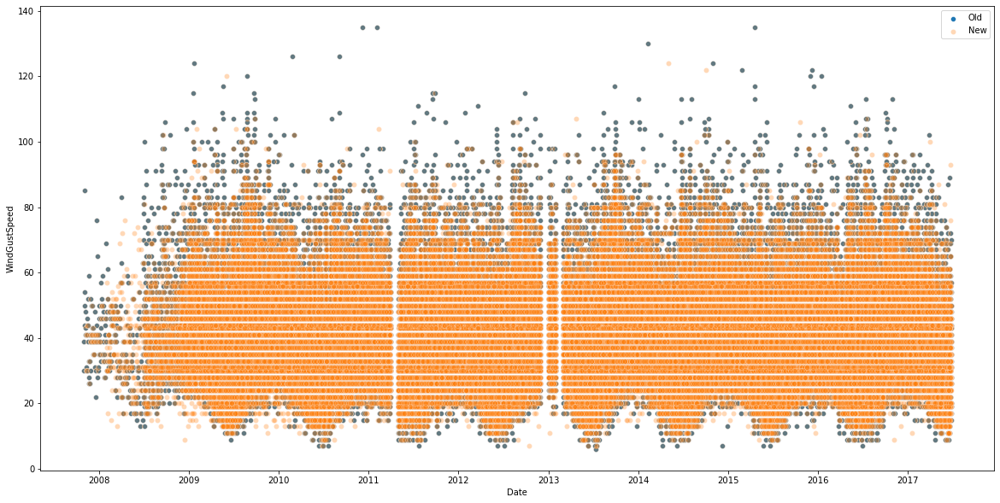

In [17]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["WindGustSpeed"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["WindGustSpeed"],label='New' , alpha = 0.3)

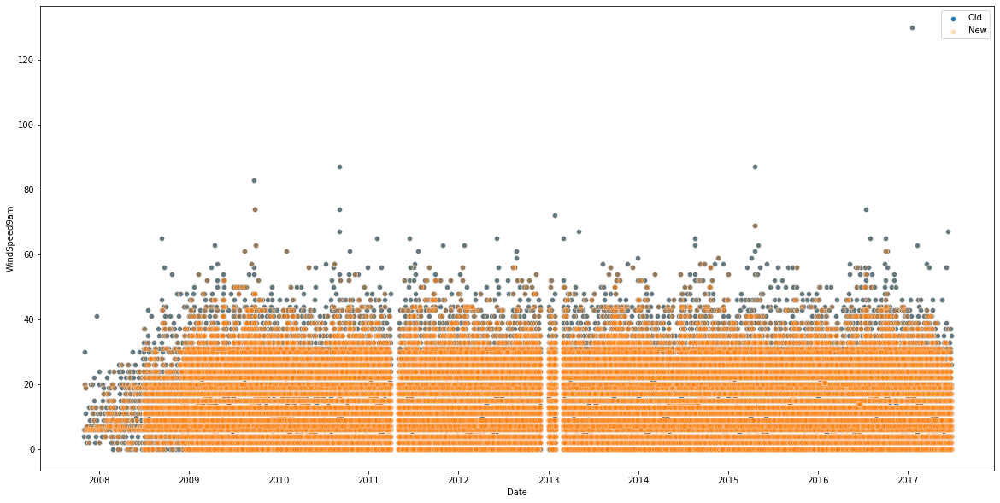

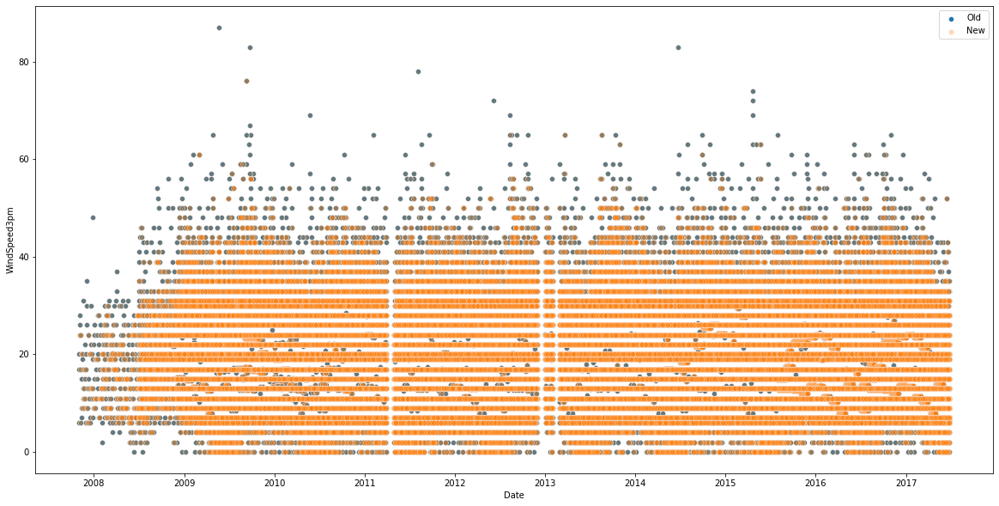

In [18]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["WindSpeed9am"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["WindSpeed9am"],label='New' , alpha = 0.3)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["WindSpeed3pm"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["WindSpeed3pm"],label='New' , alpha = 0.3)
plt.show()

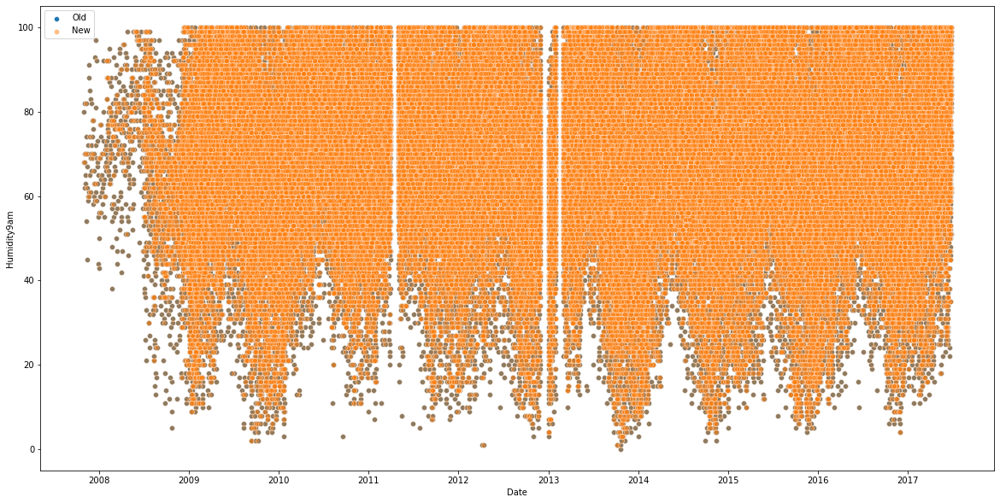

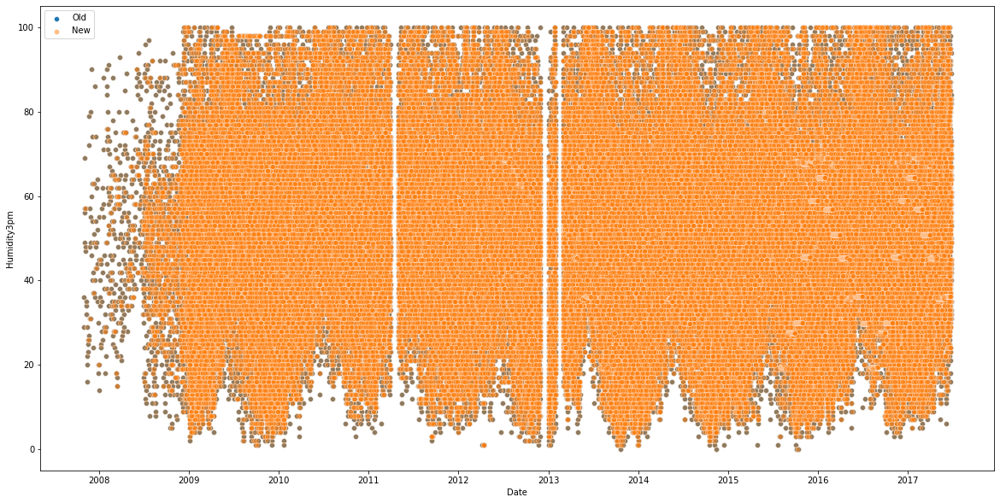

In [19]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Humidity9am"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Humidity9am"],label="New" , alpha = 0.5)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Humidity3pm"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Humidity3pm"],label='New' , alpha = 0.5)
plt.show()

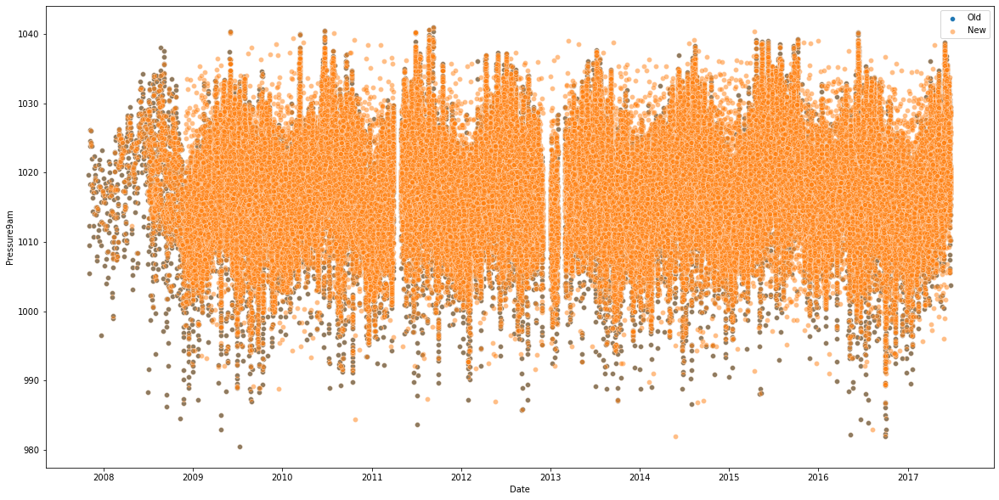

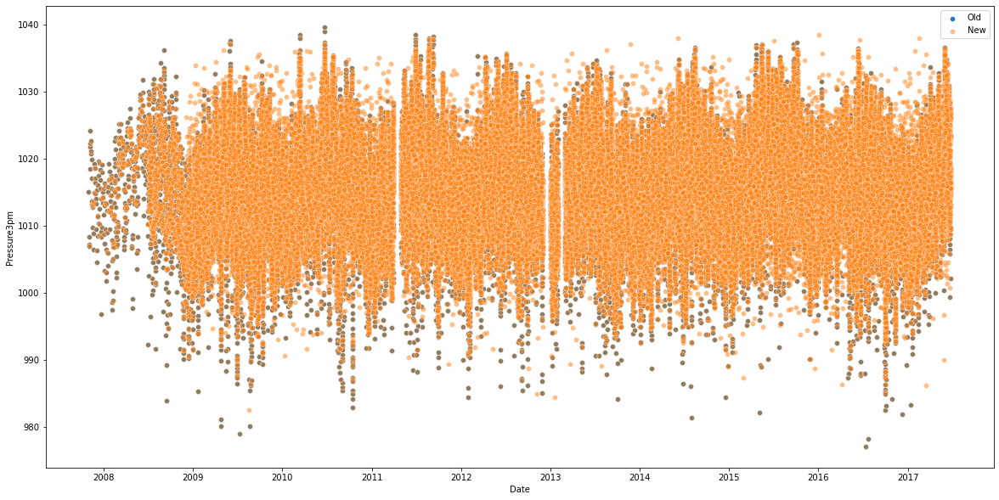

In [20]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Pressure9am"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Pressure9am"],label='New' , alpha = 0.5)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Pressure3pm"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Pressure3pm"],label='New' ,alpha = 0.5)
plt.show()

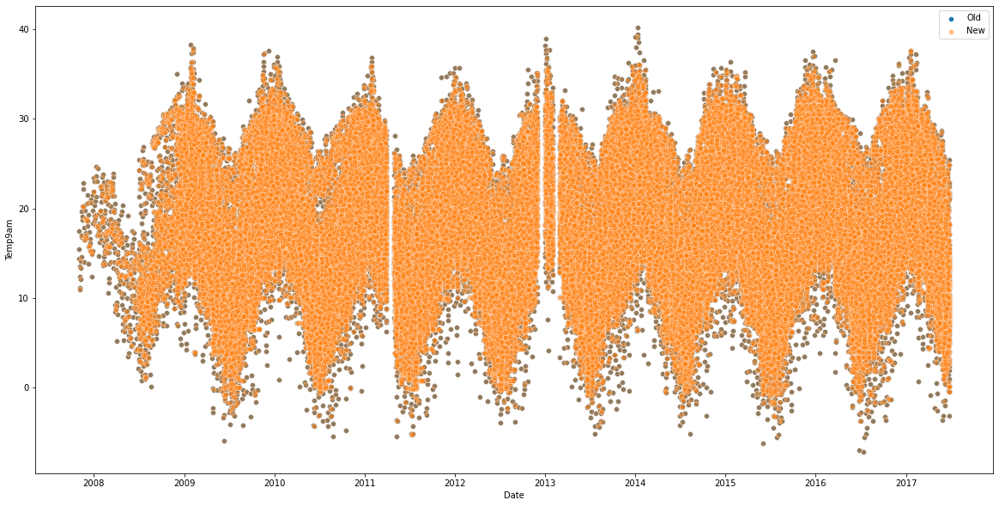

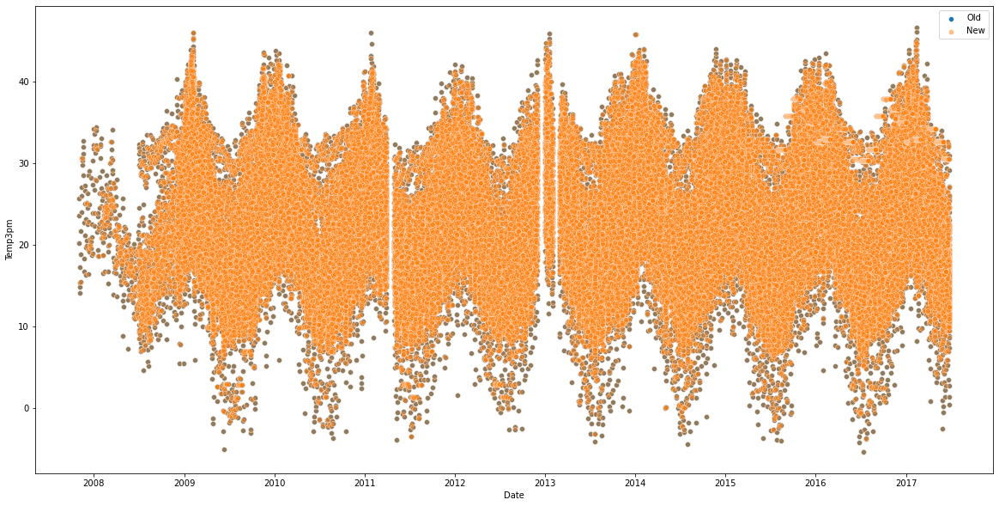

In [21]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Temp9am"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Temp9am"],label='New' , alpha = 0.5)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Temp3pm"],label='Old')
sns.scatterplot(x=Method1["Date"],y=Method1["Temp3pm"],label='New' , alpha = 0.5)
plt.show()

Now let us compare the mean of the continuous features of old dataset with mean of the continuous features of new imputed dataset.

In [22]:
a = [x for x in df.select_dtypes(include = 'float') ]
mean_old = []
mean_new = []
for i in a:
    mean_old.append(df[i].mean())
    mean_new.append(Method1[i].mean())

Mean_data = pd.DataFrame(data = np.array([mean_old , mean_new]).T, columns = ['Old Mean','New Mean'], index = a)
Mean_data

,Old Mean,New Mean
MinTemp,12.186400,12.188862
MaxTemp,23.226784,23.228112
Rainfall,2.349974,2.353387
Evaporation,5.469824,5.470342
Sunshine,7.624853,7.616593
WindGustSpeed,39.984292,39.991441
WindSpeed9am,14.001988,13.992426
WindSpeed3pm,18.637576,18.598575
Humidity9am,68.843810,68.919738
Humidity3pm,51.482606,51.590343


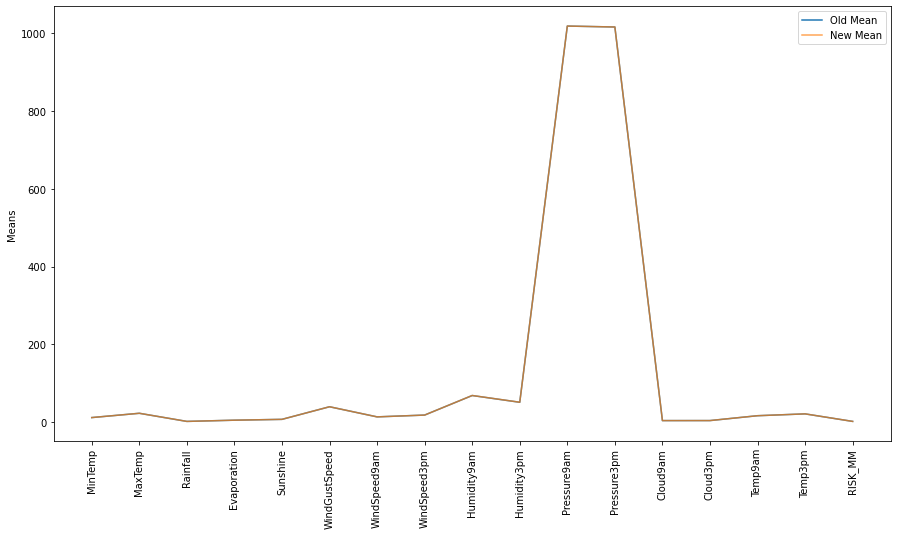

In [23]:
plt.figure(figsize = (15,8))
sns.lineplot(x=Mean_data.index,y=Mean_data['Old Mean'],label='Old Mean',alpha = 1)
sns.lineplot(x=Mean_data.index,y=Mean_data['New Mean'],label='New Mean',alpha = 0.7)
plt.legend()
plt.ylabel('Means')
plt.xticks(rotation = 90)
plt.show()

The new means completely overlaps the old mean.

Now let us compare the mean of the non-null values of the features from the old dataset to the mean of the newly filled values of the features in the new dataset.

In [24]:
a = [x for x in df.select_dtypes(include = 'float') ]
mean_old = []
mean_new = []
for i in a:
    mean_old.append(df[df[i].notnull()][i].mean())
    mean_new.append(Method1[df[i].isnull()][i].mean())

Mean_diff = pd.DataFrame(data = np.array([mean_old , mean_new]).T, columns = ['Old Mean','Imputed Mean'], index = a)
Mean_diff

,Old Mean,Imputed Mean
MinTemp,12.186400,12.735957
MaxTemp,23.226784,23.813058
Rainfall,2.349974,2.695102
Evaporation,5.469824,5.471035
Sunshine,7.624853,7.607534
WindGustSpeed,39.984292,40.093959
WindSpeed9am,14.001988,12.993345
WindSpeed3pm,18.637576,16.528979
Humidity9am,68.843810,74.929727
Humidity3pm,51.482606,55.726216


We can see some difference in the mean values. Let us plot these values. We will remove the features 'Pressure9am' and 'Pressure3pm' from the above dataframe as there is no such difference in their mean and they are increasing the y-scale of our graph. 

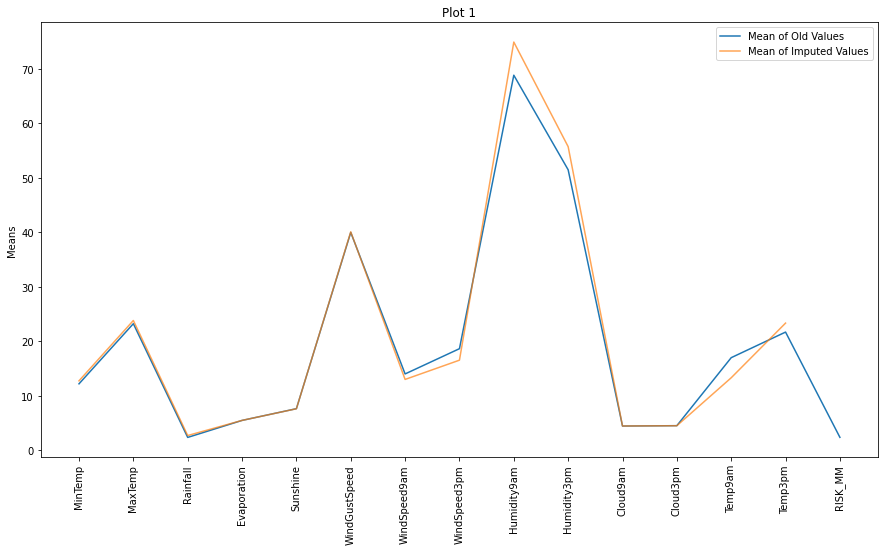

In [25]:
Mean_diff.drop(['Pressure9am','Pressure3pm'],axis = 0, inplace=True)

plt.figure(figsize = (15,8))
sns.lineplot(x=Mean_diff.index,y=Mean_diff['Old Mean'],label='Mean of Old Values',alpha = 1)
sns.lineplot(x=Mean_diff.index,y=Mean_diff['Imputed Mean'],label='Mean of Imputed Values',alpha = 0.7)
plt.legend()
plt.title('Plot 1')
plt.ylabel('Means')
plt.xticks(rotation = 90)
plt.show()

### 2) Imputation Using Mean of the Preceeding and Succeeding Value 

For this method we will also use the same continuous features having data for all the locations.

In [26]:
dataframes_list1 = []
for location in df["Location"].unique():
    location_wise_data1 = df[df["Location"] == location]
    location_wise_data1.set_index("Date" , inplace = True)
    location_wise_data1[continuous_features] = (location_wise_data1[continuous_features].ffill()+location_wise_data1[continuous_features].bfill())/2
    location_wise_data1[continuous_features] = location_wise_data1[continuous_features].bfill().ffill()
    dataframes_list1.append(location_wise_data1)

In [27]:
Method2 = pd.concat(dataframes_list1)
Method2.reset_index(inplace = True)

In [28]:
round(( Method2[continuous_features].isnull().sum() / Method2.shape[0] ) *100 , 5)

MinTemp         0.0
MaxTemp         0.0
Rainfall        0.0
WindSpeed9am    0.0
WindSpeed3pm    0.0
Humidity9am     0.0
Humidity3pm     0.0
Temp9am         0.0
Temp3pm         0.0
dtype: float64

For the remaining continuous features and all the categorical features we will use Mice Forest Imputation.

In [29]:
import miceforest as mf
kernel = mf.MultipleImputedKernel(data = Method2 , save_all_iterations= True , random_state=0)
new_imputed_data = kernel.impute_new_data(Method2)
Method2 = new_imputed_data.complete_data(0)

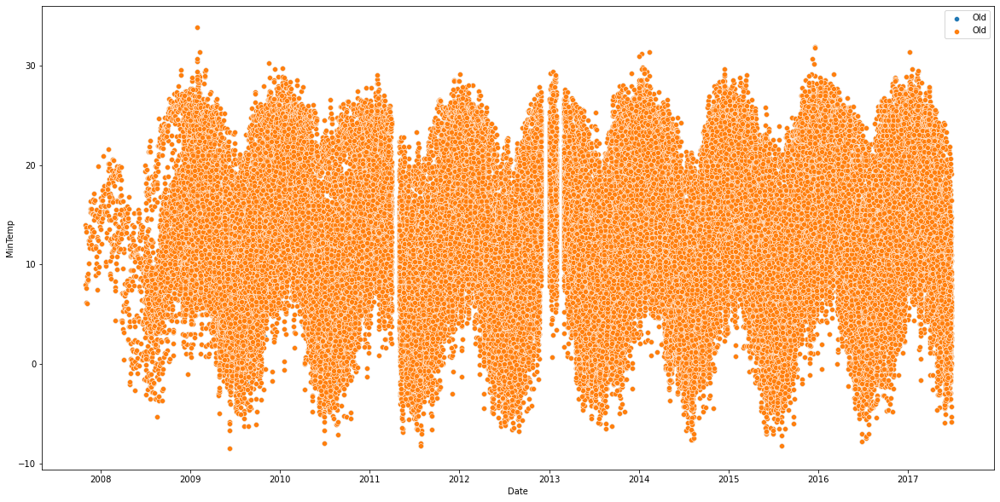

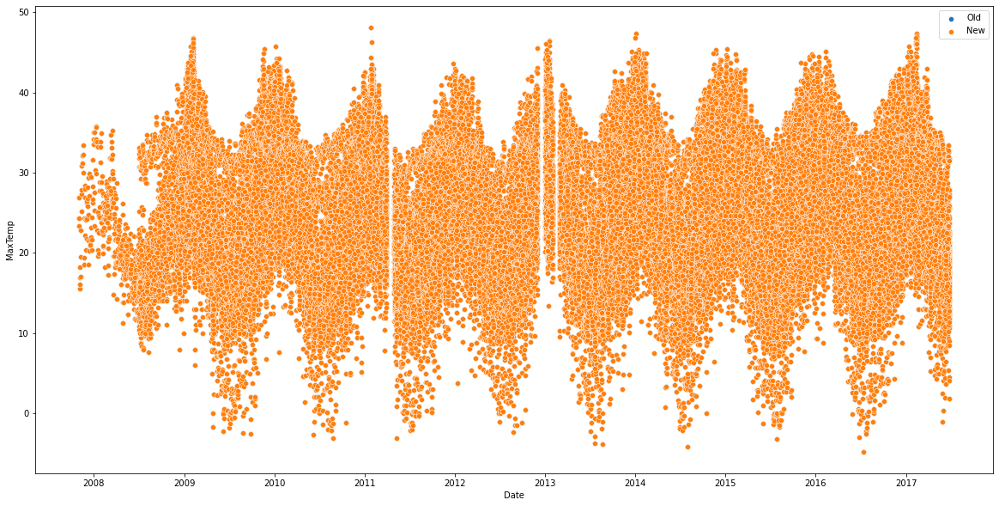

In [30]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["MinTemp"],label="Old")
sns.scatterplot(x=Method2["Date"],y=Method2["MinTemp"],label="Old")
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["MaxTemp"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["MaxTemp"],label='New')
plt.show()

<AxesSubplot:xlabel='Date', ylabel='Rainfall'>

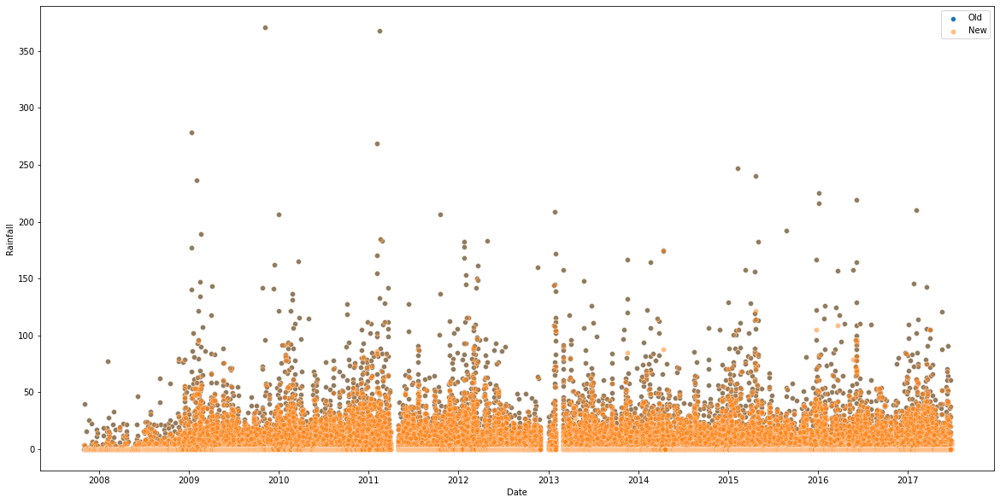

In [31]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Rainfall"],label='Old' )
sns.scatterplot(x=Method2["Date"],y=Method2["Rainfall"],label='New' , alpha = 0.5)

<AxesSubplot:xlabel='Date', ylabel='Evaporation'>

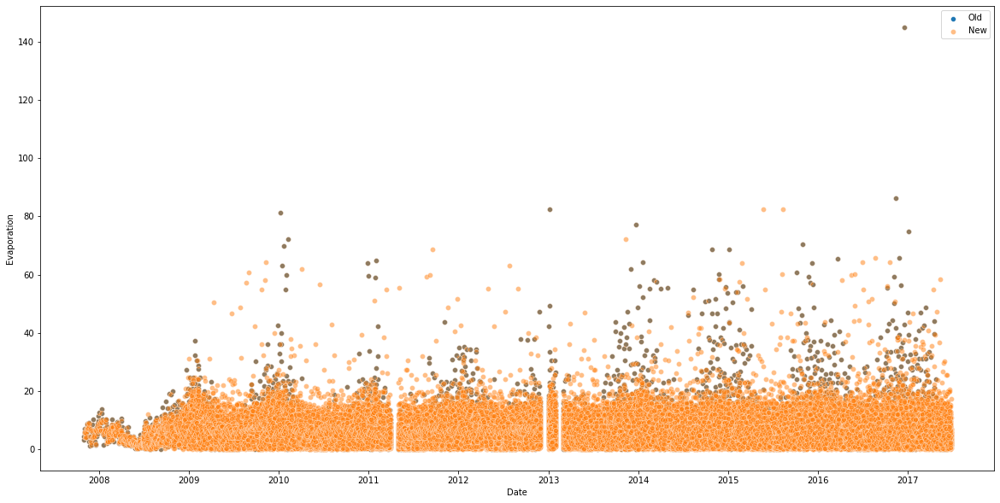

In [32]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Evaporation"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Evaporation"],label='New',alpha = 0.5)

<AxesSubplot:xlabel='Date', ylabel='WindGustSpeed'>

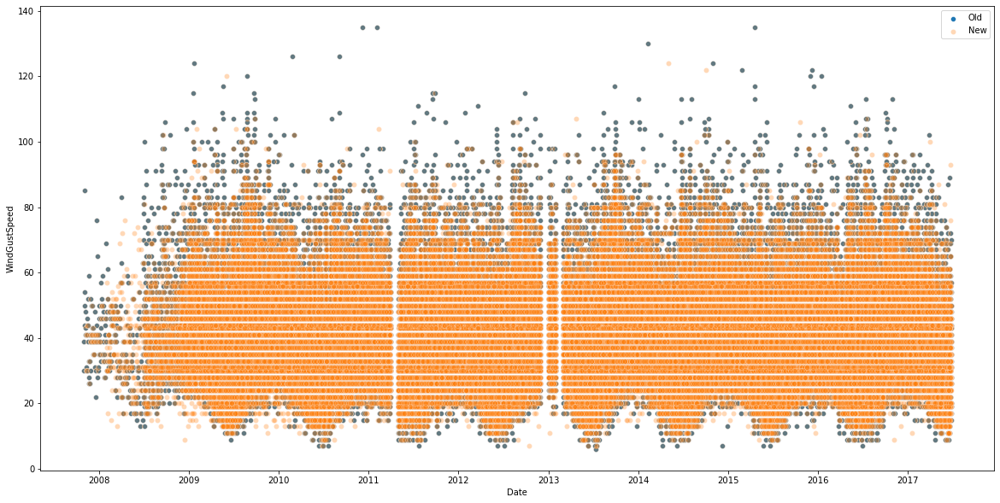

In [33]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["WindGustSpeed"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["WindGustSpeed"],label='New' , alpha = 0.3)

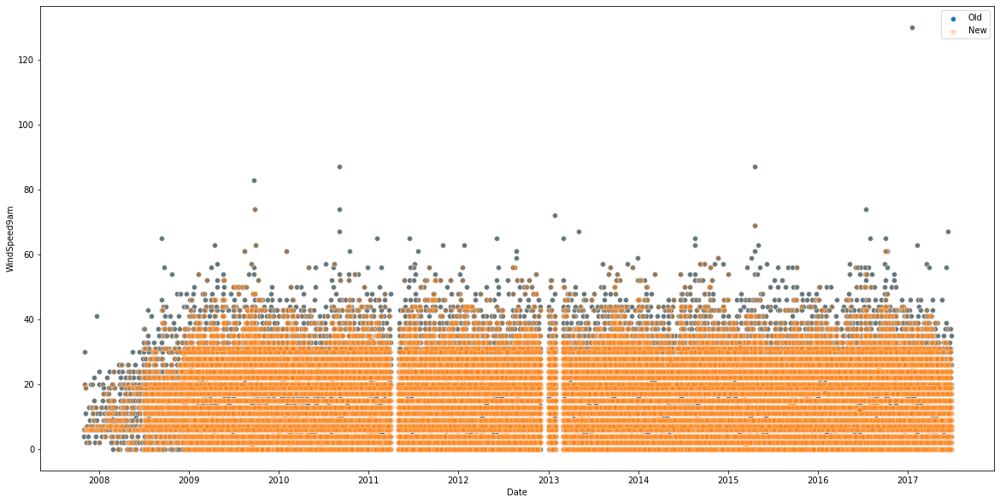

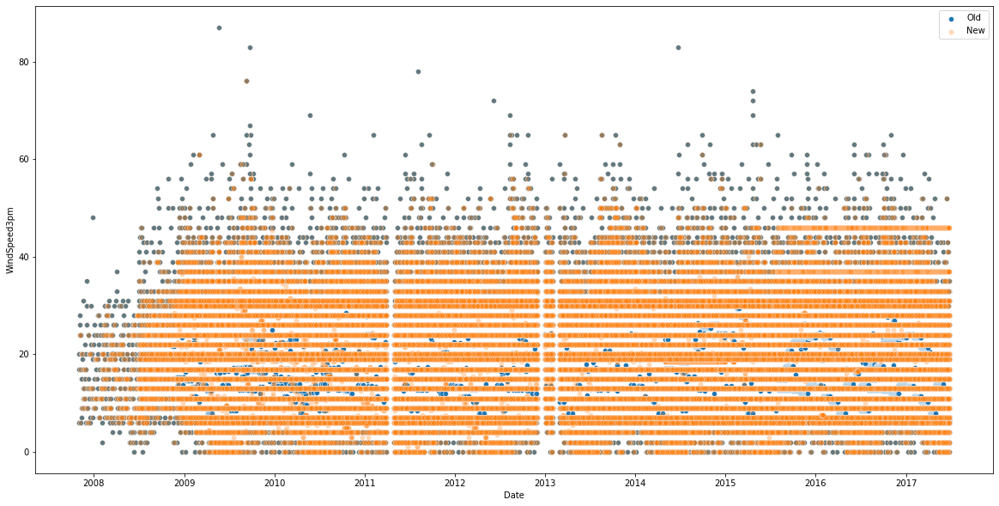

In [34]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["WindSpeed9am"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["WindSpeed9am"],label='New' , alpha = 0.3)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["WindSpeed3pm"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["WindSpeed3pm"],label='New' , alpha = 0.3)
plt.show()

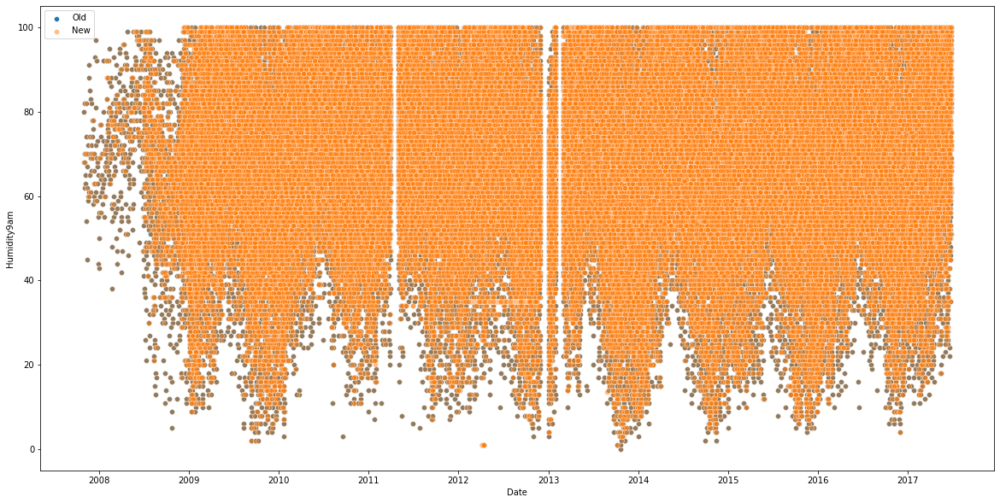

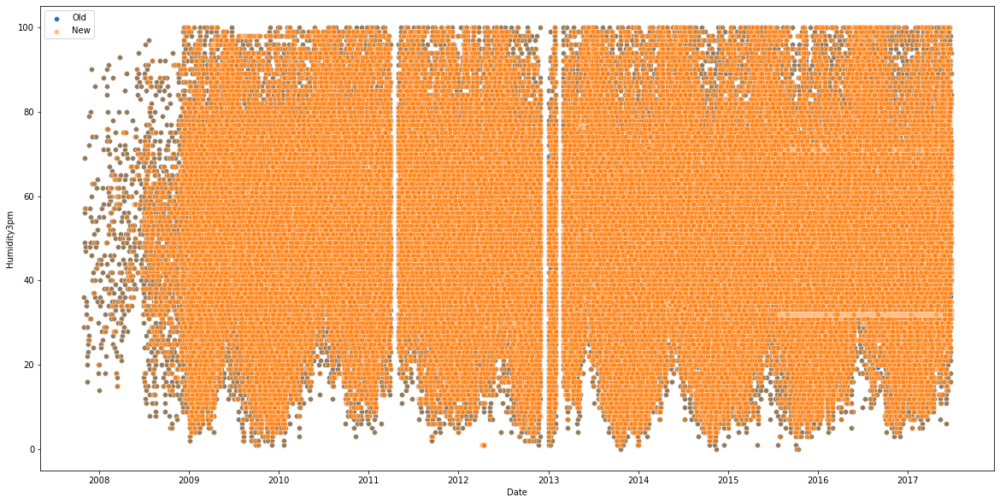

In [35]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Humidity9am"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Humidity9am"],label="New" , alpha = 0.5)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Humidity3pm"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Humidity3pm"],label='New' , alpha = 0.5)
plt.show()

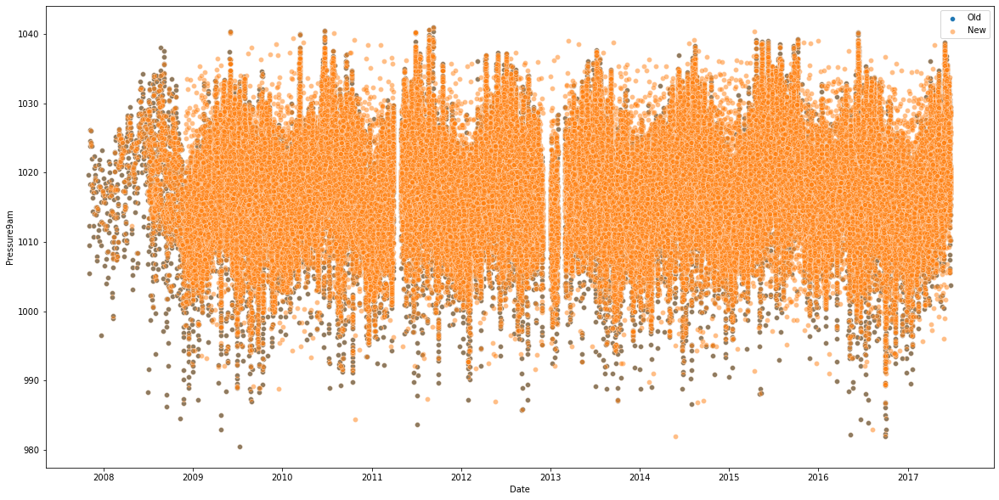

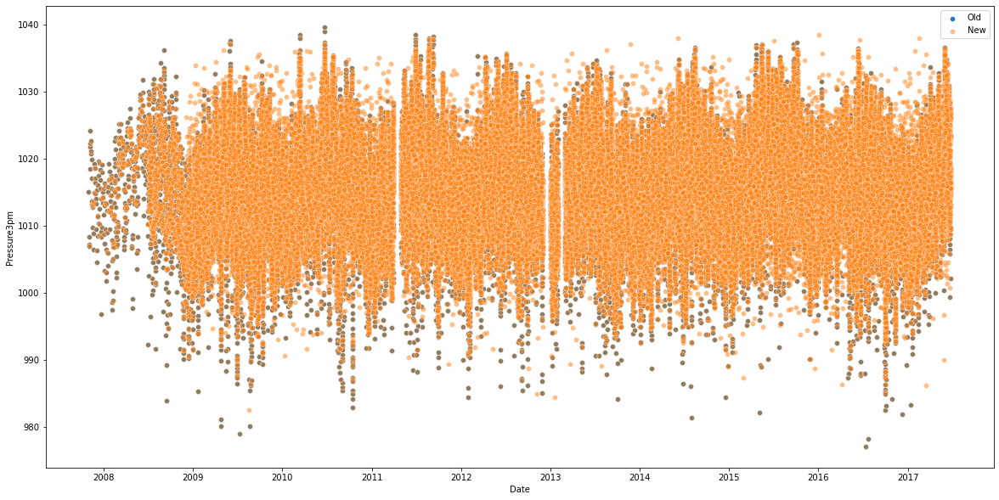

In [36]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Pressure9am"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Pressure9am"],label='New' , alpha = 0.5)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Pressure3pm"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Pressure3pm"],label='New' ,alpha = 0.5)
plt.show()

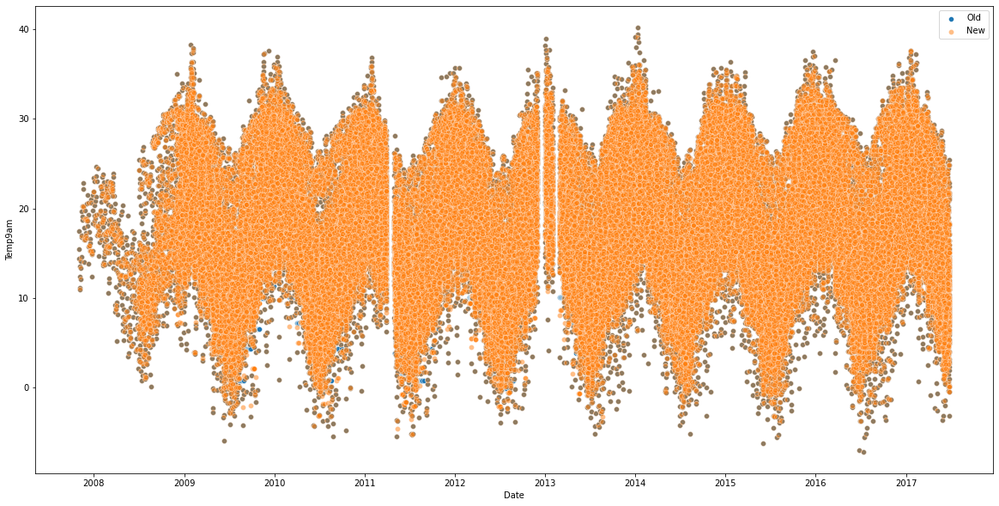

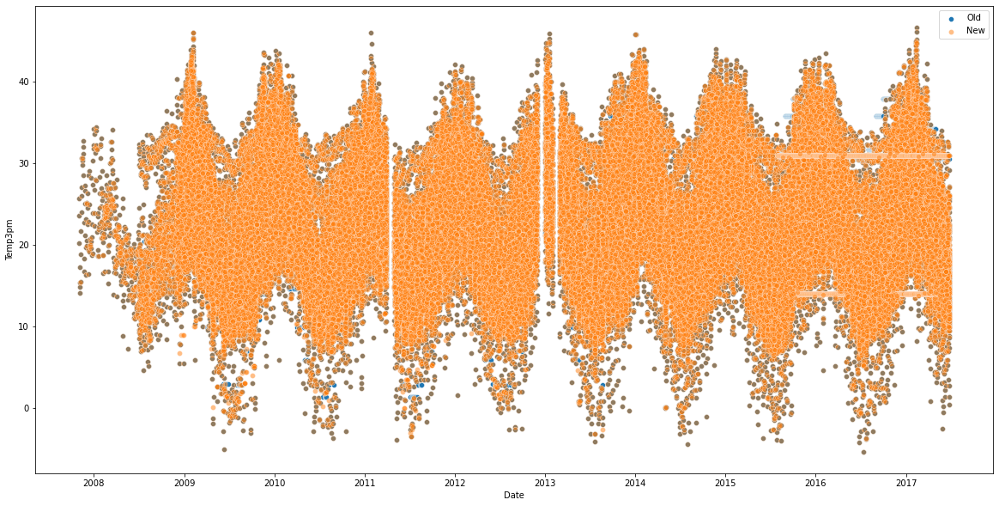

In [37]:
plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Temp9am"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Temp9am"],label='New' , alpha = 0.5)
plt.show()

plt.figure(figsize=(20,10))
sns.scatterplot(x=df3["Date"],y=df3["Temp3pm"],label='Old')
sns.scatterplot(x=Method2["Date"],y=Method2["Temp3pm"],label='New' , alpha = 0.5)
plt.show()

Let us plot the same graphs here from the first method.

In [38]:
a = [x for x in df.select_dtypes(include = 'float') ]
mean_old = []
mean_new = []
for i in a:
    mean_old.append(df[i].mean())
    mean_new.append(Method2[i].mean())

Mean_data1 = pd.DataFrame(data = np.array([mean_old , mean_new]).T, columns = ['Old Mean','New Mean'], index = a)
Mean_data1

,Old Mean,New Mean
MinTemp,12.186400,12.189086
MaxTemp,23.226784,23.228349
Rainfall,2.349974,2.376369
Evaporation,5.469824,5.470342
Sunshine,7.624853,7.616593
WindGustSpeed,39.984292,39.991441
WindSpeed9am,14.001988,14.005612
WindSpeed3pm,18.637576,18.852531
Humidity9am,68.843810,68.875360
Humidity3pm,51.482606,51.362138


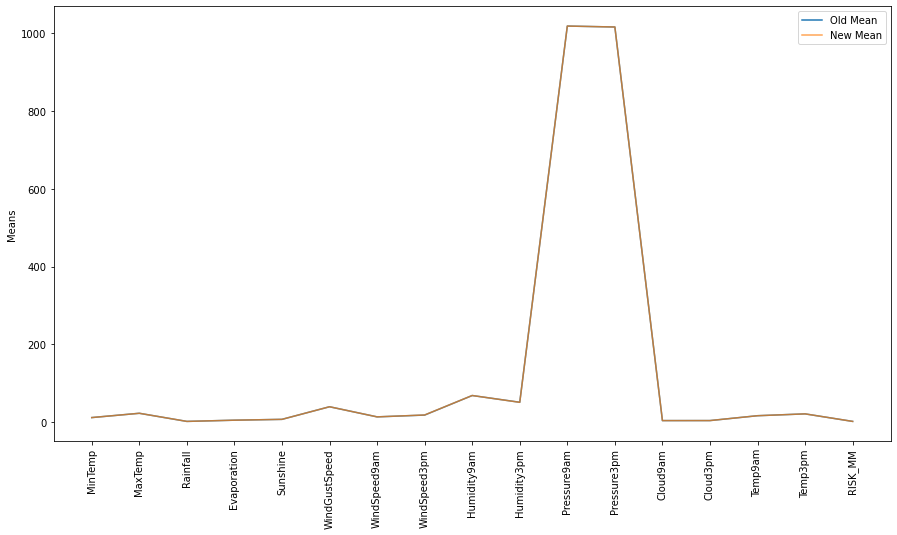

In [39]:
plt.figure(figsize = (15,8))
sns.lineplot(x=Mean_data1.index,y=Mean_data1['Old Mean'],label='Old Mean',alpha = 1)
sns.lineplot(x=Mean_data1.index,y=Mean_data1['New Mean'],label='New Mean',alpha = 0.7)
plt.legend()
plt.ylabel('Means')
plt.xticks(rotation = 90)
plt.show()

In [40]:
a = [x for x in df.select_dtypes(include = 'float') ]
mean_old = []
mean_new = []
for i in a:
    mean_old.append(df[df[i].notnull()][i].mean())
    mean_new.append(Method2[df[i].isnull()][i].mean())

Mean_diff1 = pd.DataFrame(data = np.array([mean_old , mean_new]).T, columns = ['Old Mean','Imputed Mean'], index = a)
Mean_diff1

,Old Mean,Imputed Mean
MinTemp,12.186400,12.786028
MaxTemp,23.226784,23.917702
Rainfall,2.349974,5.019346
Evaporation,5.469824,5.471035
Sunshine,7.624853,7.607534
WindGustSpeed,39.984292,40.093959
WindSpeed9am,14.001988,14.384273
WindSpeed3pm,18.637576,30.259316
Humidity9am,68.843810,71.372604
Humidity3pm,51.482606,46.737535


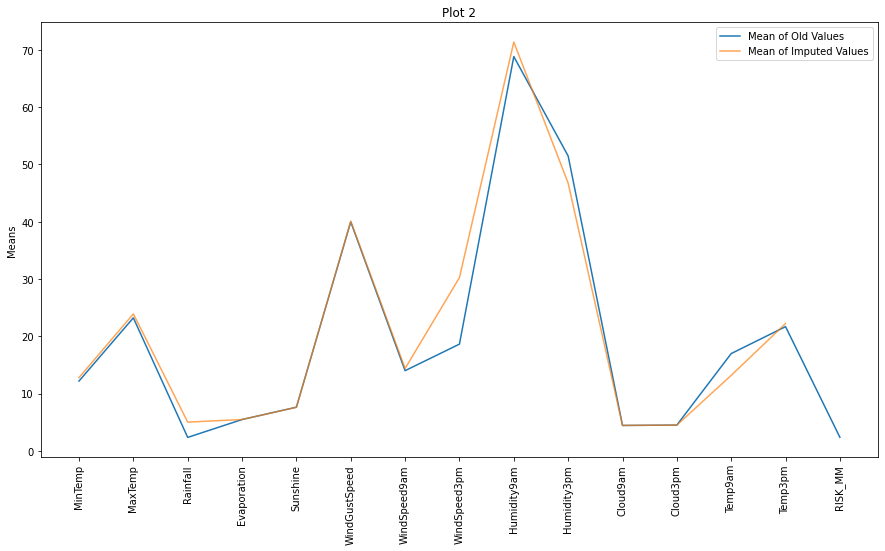

In [41]:
Mean_diff1.drop(['Pressure9am','Pressure3pm'],axis = 0, inplace=True)
plt.figure(figsize = (15,8))
sns.lineplot(x=Mean_diff1.index,y=Mean_diff1['Old Mean'],label='Mean of Old Values',alpha = 1)
sns.lineplot(x=Mean_diff1.index,y=Mean_diff1['Imputed Mean'],label='Mean of Imputed Values',alpha = 0.7)
plt.legend()
plt.title('Plot 2')
plt.ylabel('Means')
plt.xticks(rotation = 90)
plt.show()

## Selecting the Best Imputation Method.

Let us plot, Plot 1 and Plot 2 together to get a better idea of both the imputation methods.

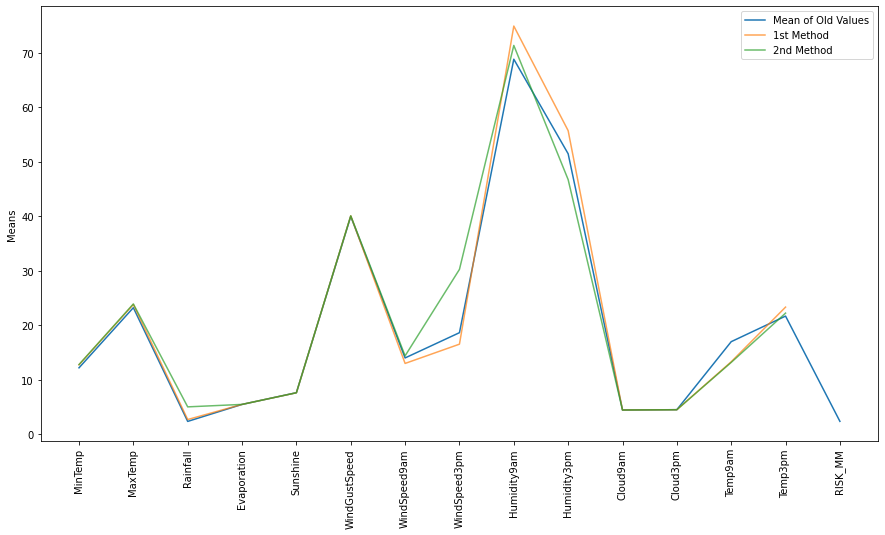

In [42]:
plt.figure(figsize = (15,8))
sns.lineplot(x=Mean_diff1.index,y=Mean_diff1['Old Mean'],label='Mean of Old Values',alpha = 1)
sns.lineplot(x=Mean_diff.index,y=Mean_diff['Imputed Mean'],label='1st Method',alpha = 0.7)
sns.lineplot(x=Mean_diff1.index,y=Mean_diff1['Imputed Mean'],label='2nd Method',alpha = 0.7)

plt.legend()

plt.ylabel('Means')
plt.xticks(rotation = 90)
plt.show()

__*By looking and analyzing all the plots we can say that the 1st Method (Mean Imputation w.r.t corresponding Location & Month) is performing slightly better than the 2nd Method (Imputation Using Mean of the Preceeding and Succeeding Value).*__

__*Creating a new CSV file for the cleaned data.*__

In [43]:
Method1.drop(['Month','Year'], axis = 1, inplace = True)

In [44]:
Method1.to_csv("Cleaned_data.csv" , index = None)